In [128]:
%load_ext autoreload
%autoreload 2

import numpy as np
import m2py.segmentation.segmentation_gmm as seg_gmm
import m2py.segmentation.segmentation_watershed as seg_water
from m2py.utils import pre_processing as pre
from m2py.utils import post_processing as post
from m2py.utils import seg_label_utils as slu
from m2py.utils import config

import matplotlib.pyplot as plt


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [19]:
fill_zeros_flag = True
noise_removal_flag = True
input_cmap = "jet"

In [167]:
# cAFM data
data_file = "/Users/diegotorrejon/Dropbox/SSTS_files/Manuscript/data_files/WT2-97_cafm.npy"
data_type = "cAFM"
data_subtype = "Nanowires"

# Paper data (cafm)
data_file = "/Users/diegotorrejon/Dropbox/SSTS_files/Manuscript/data_files/WT2-97_cAFM0003.npy"
data_type = "cAFM"
data_subtype = "Nanowires"


# Paper data (amfm)
data_file = "/Users/diegotorrejon/Dropbox/SSTS_files/Manuscript/data_files/WT2-107_amfm_90.npy"
data_type = "AMFM"
data_subtype = "Nanowires"

# Paper data (nanowires)
#data_file = "/Users/diegotorrejon/Dropbox/SSTS_files/Manuscript/data_files/100-0_72_NW_combined.npy"
#data_type = "QNM"
#data_subtype = "Nanowires"

# Paper data (opv)
#data_file = "/Users/diegotorrejon/Dropbox/SSTS_files/Manuscript/data_files/175C_30min_Sub8_Dev8.npy"
#data_type = "QNM"
#data_subtype = "Nanowires"

# Paper data (opv)
#data_file = "/Users/diegotorrejon/Dropbox/SSTS_files/Manuscript/data_files/PTB7PC71BM_CBonly_ascast_fresh_500 nm_combined.npy"
#data_type = "QNM"
#data_subtype = "2ComponentFilms"

data = np.load(data_file)

data_properties = config.data_info[data_type]['properties']
print(data_properties)


['Height', 'Deformation', 'Youngs Modulus', 'Phase']


/Users/diegotorrejon/Projects/Other/m2py/VENV/lib/python3.6/site-packages/numpy/lib/function_base.py:2400: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Users/diegotorrejon/Projects/Other/m2py/VENV/lib/python3.6/site-packages/numpy/lib/function_base.py:2401: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


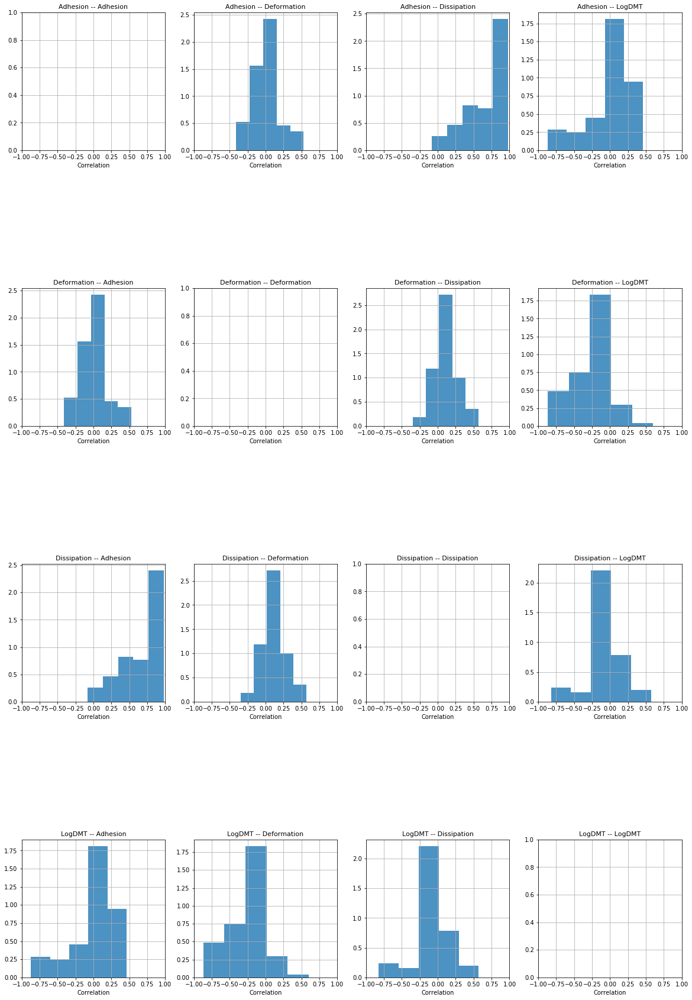

In [168]:
# NOTE: I picked backgrounded because it has the most data files
data_dir = "/Users/diegotorrejon/Dropbox/SSTS_files/AFM/QNM/Backgrounded/Combined/"
pre.show_correlations(data.shape[2], "QNM", data_dir)


/Users/diegotorrejon/Projects/Other/m2py/VENV/lib/python3.6/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


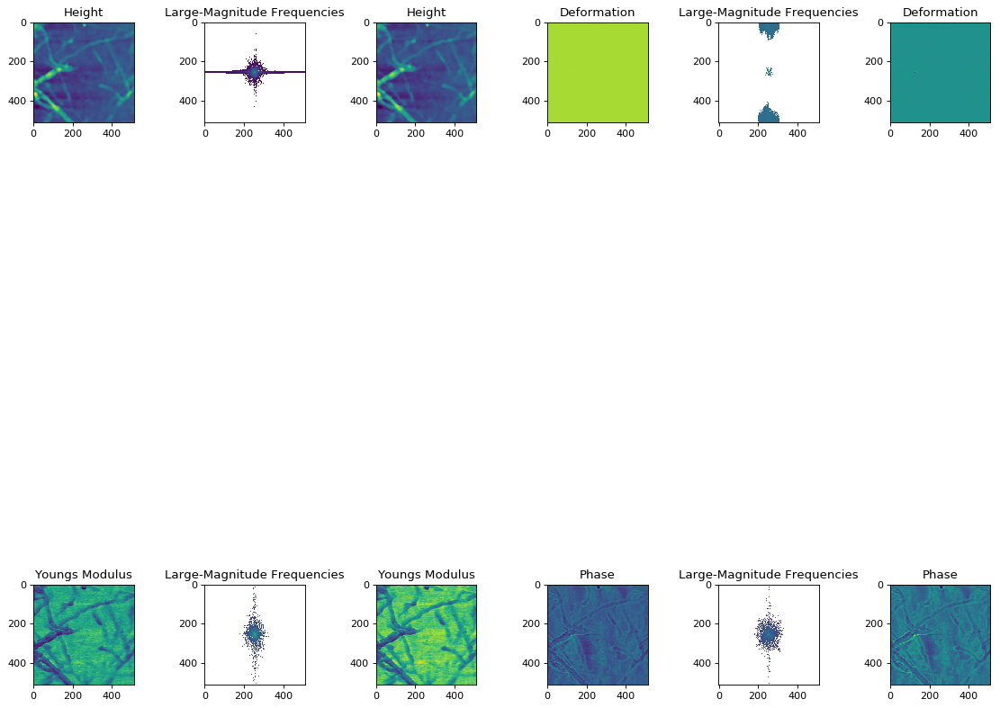

In [169]:
# Apply high pass filter
filtered_data = pre.apply_frequency_removal(data, data_type)


There were 1 chips generated.


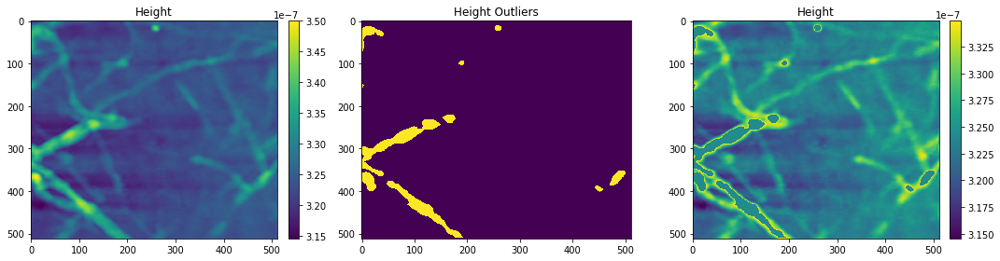

In [170]:
# Get (z-score) outliers from height property
outliers = pre.extract_outliers(filtered_data, data_type, "Height", 2.5, 512, 512)
pre.show_outliers(filtered_data, data_type, "Height", outliers)

no_outliers_data = pre.smooth_outliers_from_data(filtered_data, outliers)


There were 1 chips generated.


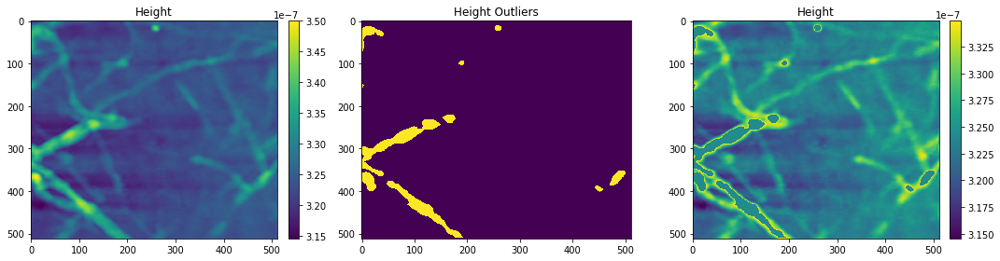

There were 1 chips generated.


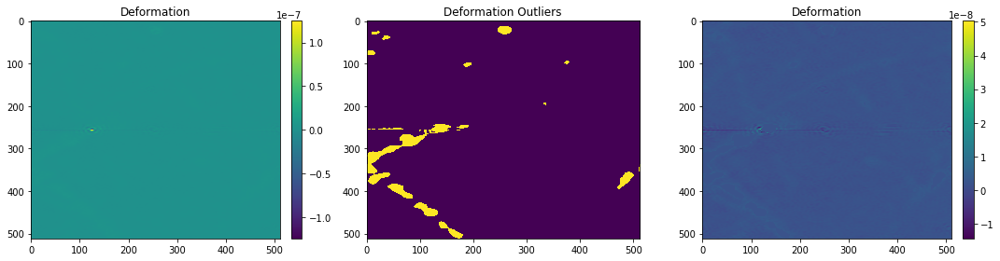

There were 1 chips generated.


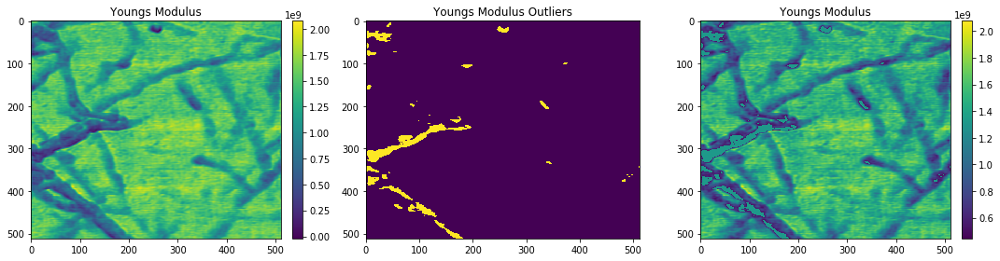

There were 1 chips generated.


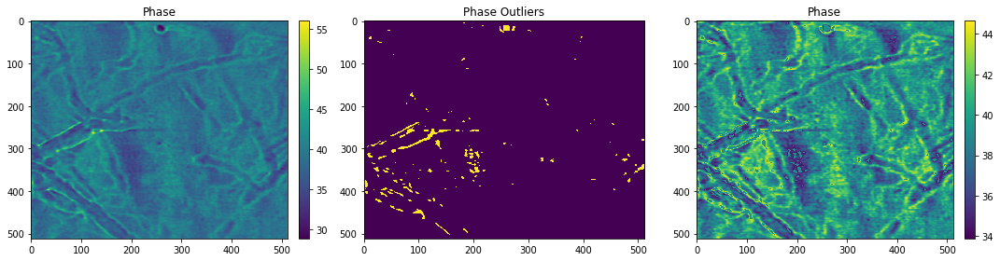

Overall outlier mask


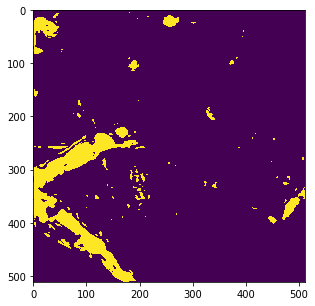

In [171]:
# Get outliers from all properties
h, w, c = filtered_data.shape
outliers = np.zeros((h, w))
for prop in data_properties:
    temp_outliers = pre.extract_outliers(filtered_data, data_type, prop, 2.5, 512, 512)
    pre.show_outliers(filtered_data, data_type, prop, temp_outliers)
    
    outliers = np.logical_or(outliers, temp_outliers)
    
# Plots combination of all outlier massk
print("Overall outlier mask")
plt.figure(figsize=(5,5))
plt.imshow(outliers)
plt.show()

no_outliers_data = pre.smooth_outliers_from_data(filtered_data, outliers)
    

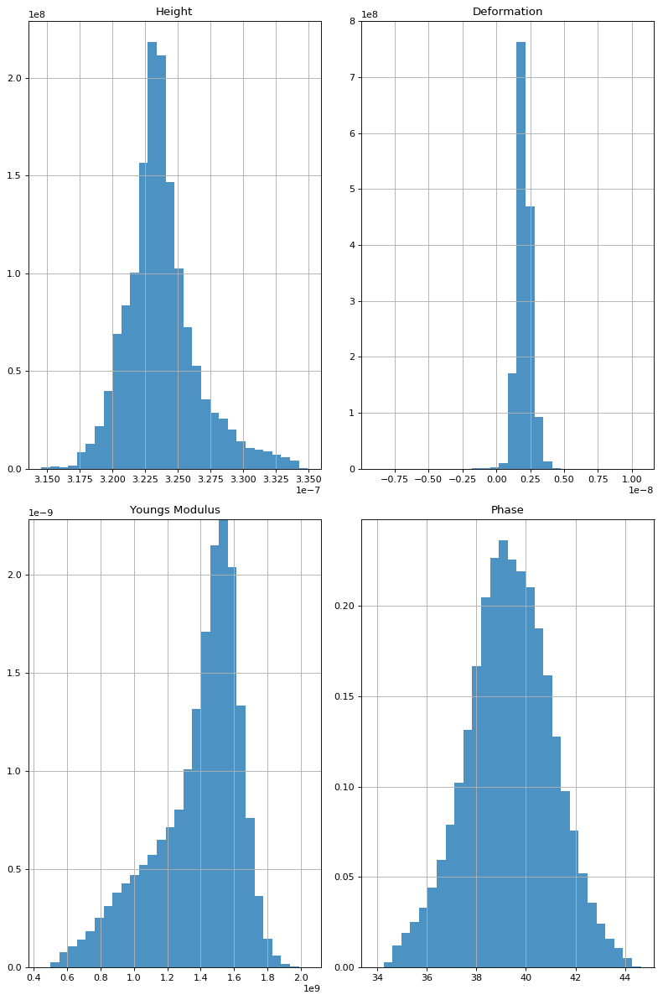

In [172]:
# Show a-priori property distributions
if noise_removal_flag:
    pre.show_property_distributions(no_outliers_data, data_type, outliers)
else:
    pre.show_property_distributions(data, data_type)
    

In [173]:
# Remove noisy channels
data, new_data_properties = pre.remove_noisy_channels(no_outliers_data, data_properties)


Removing channel: Deformation


In [174]:
# Apply semantic segmentation (GMM)
c = data.shape[2]
num_pca_components = min(4, c)
seg = seg_gmm.SegmenterGMM(n_components=2, embedding_dim=num_pca_components,
                           nonlinear=True, normalize=True,
                          padding=1, zscale=False)

if noise_removal_flag:
    pre_labels = seg.fit_transform(no_outliers_data, outliers)
else:
    pre_labels = seg.fit_transform(data)

if num_pca_components < c: # Store PCA components
    seg.store_pca_components(data, "pca_components.npy")
    
post.store_results(pre_labels, "semantic_segmentation_result.npy")


In [175]:
if fill_zeros_flag:
    pre_labels = slu.fill_out_zeros(pre_labels, outliers)
elif noise_removal_flag:
    pre_labels = np.ma.masked_where(outliers == 1, pre_labels)
    

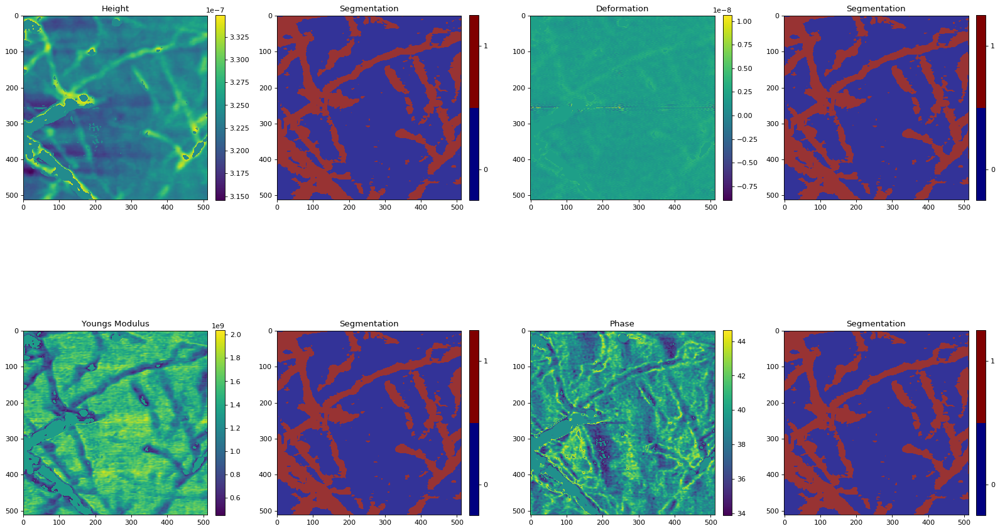

In [176]:
# Semantic segmentation of properties
if noise_removal_flag:
    post.show_classification(pre_labels, no_outliers_data, data_type)
else:
    post.show_classification(pre_labels, data, data_type)
    

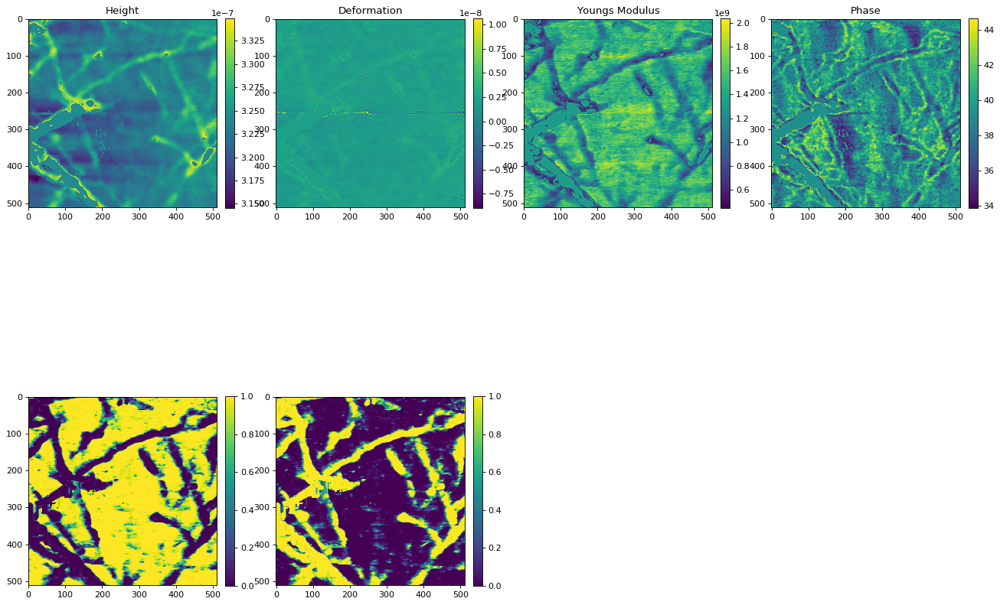

In [177]:
# Semantic segmentation likelihood of properties
if fill_zeros_flag:
    probs = seg.get_probabilities(no_outliers_data)
    probs = slu.fill_out_zeros(probs, outliers)

    post.show_overlaid_distribution(probs, no_outliers_data, data_type)
elif noise_removal_flag:
    probs = seg.get_probabilities(no_outliers_data)
    post.show_overlaid_distribution(probs, no_outliers_data, data_type, outliers)
else:
    probs = seg.get_probabilities(data)
    post.show_overlaid_distribution(probs, data, data_type)


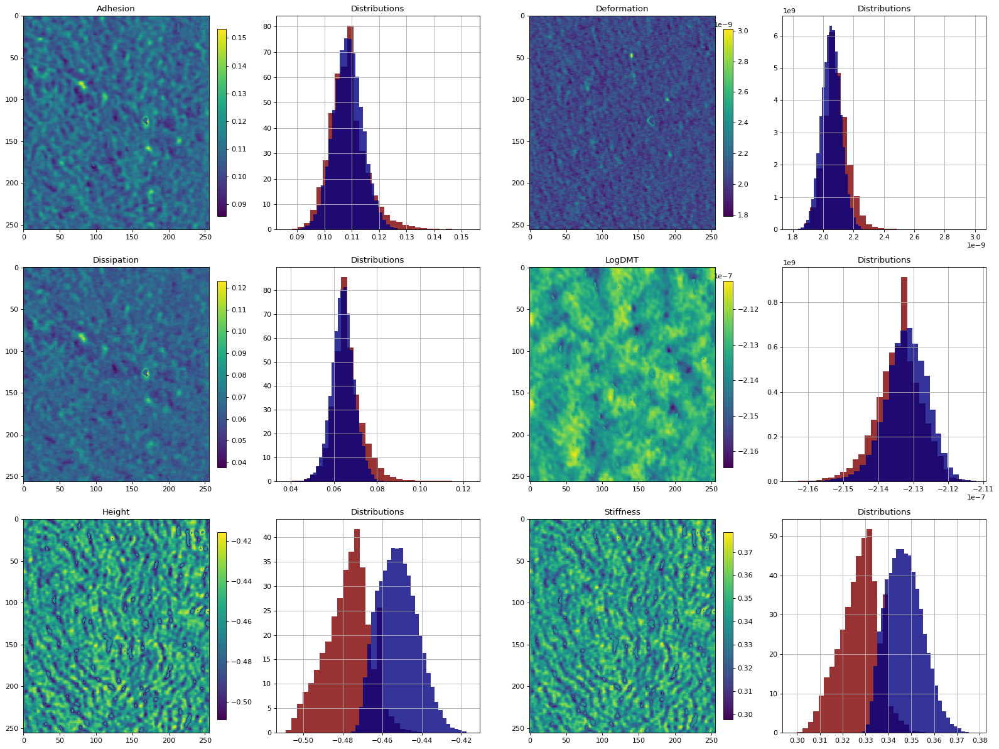

In [15]:
# Distributions of properties after semantic segmentation
if noise_removal_flag:
    post.show_classification_distributions(pre_labels, no_outliers_data, data_type)
else:
    post.show_classification_distributions(pre_labels, data, data_type)
    

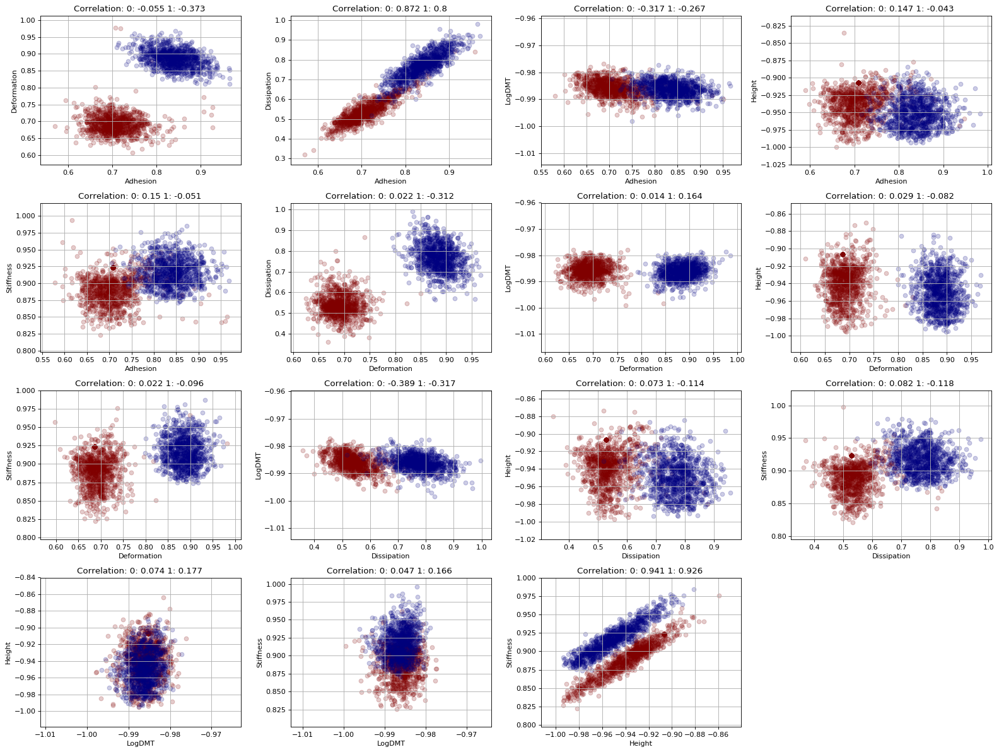

In [16]:
# Scatter plot and correlation of properties after semantic segmentation
if noise_removal_flag:
    post.show_classification_correlation(pre_labels, no_outliers_data, data_type)
else:
    post.show_classification_correlation(pre_labels, data, data_type)
    

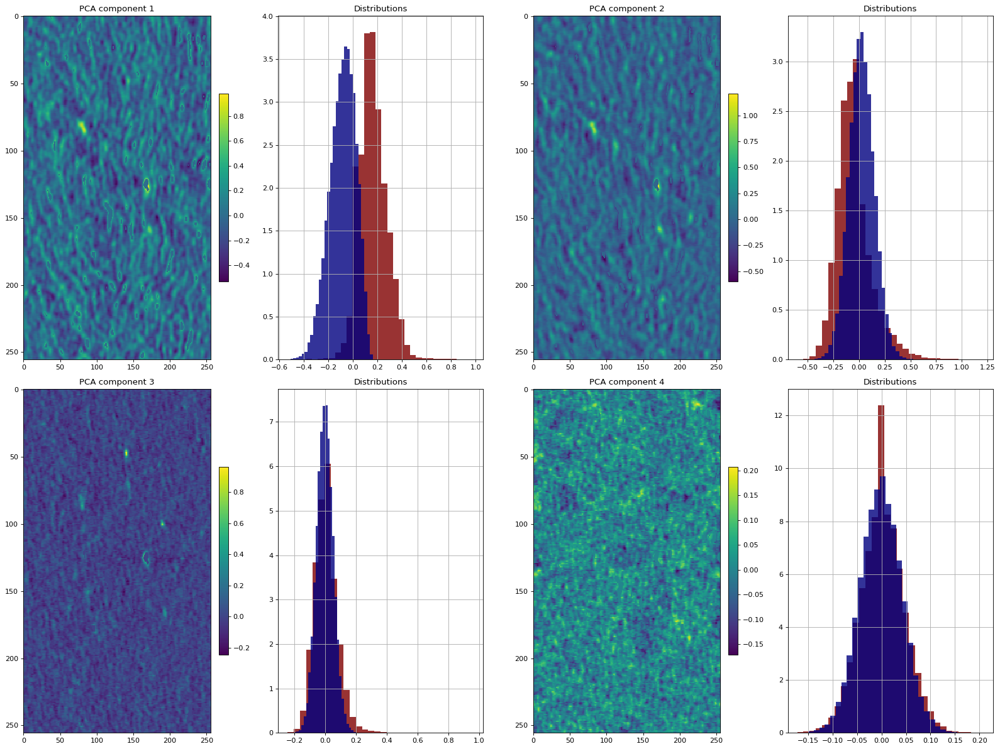

In [17]:
# Distributions of PCA components after semantic segmentation
if noise_removal_flag:
    pca_components = seg.get_pca_components(no_outliers_data)
else:
    pca_components = seg.get_pca_components(data)

h, w, c = data.shape
pca_components = pca_components.reshape(h, w, num_pca_components)

post.show_classification_distributions(pre_labels, pca_components, data_type, title_flag=False)


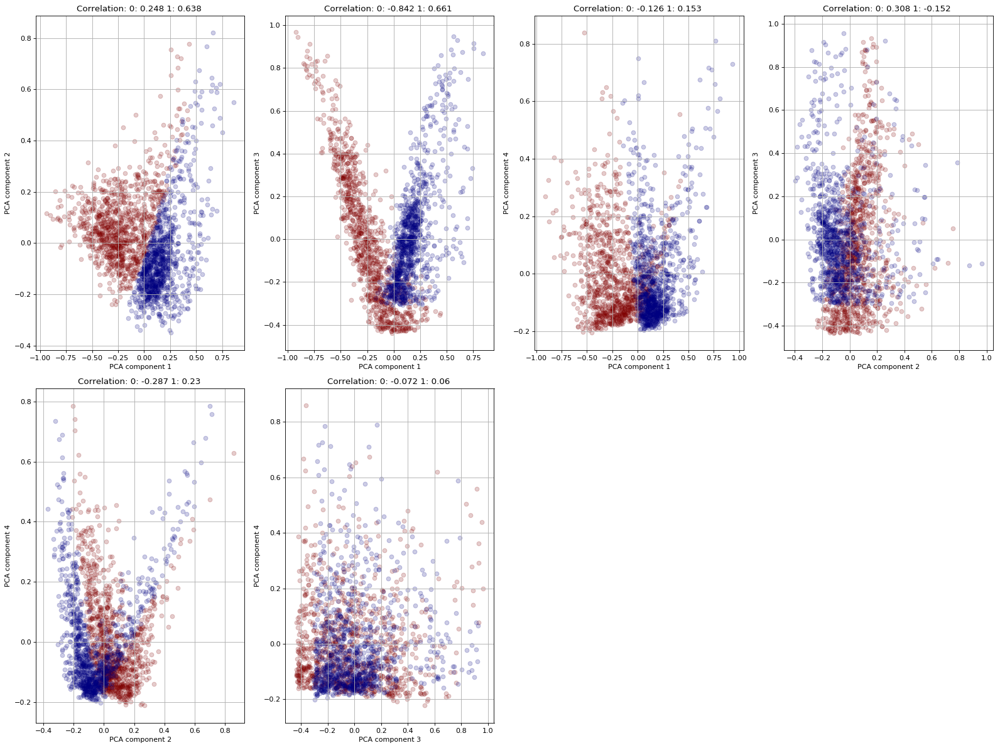

In [238]:
# Scatter plot and correlation of PCA components after semantic segmentation
post.show_classification_correlation(pre_labels, pca_components, data_type, title_flag=False)


In [239]:
# Apply instance segmentation (connected components)
post_labels = seg.get_grains(pre_labels)
grain_labels = slu.get_significant_labels(post_labels, bg_contrast_flag=True)

post.store_results(grain_labels, "instance_segmentation_result.npy")


In [240]:
if fill_zeros_flag:
    grain_labels = slu.fill_out_zeros(grain_labels, grain_labels == 0)
elif noise_removal_flag:
    grain_labels = np.ma.masked_where(grain_labels == 0, grain_labels)


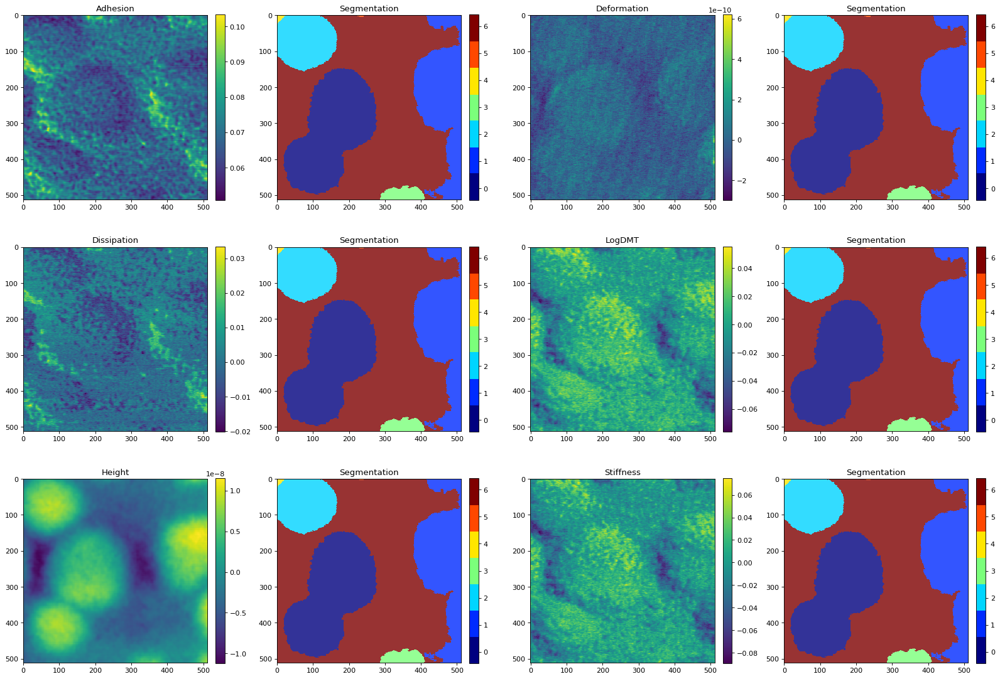

In [241]:
# Instance (grains) segmentation of properties
if noise_removal_flag:
    post.show_classification(grain_labels, no_outliers_data, data_type, input_cmap=input_cmap)
else:
    post.show_classification(grain_labels, data, data_type, input_cmap=input_cmap)
    

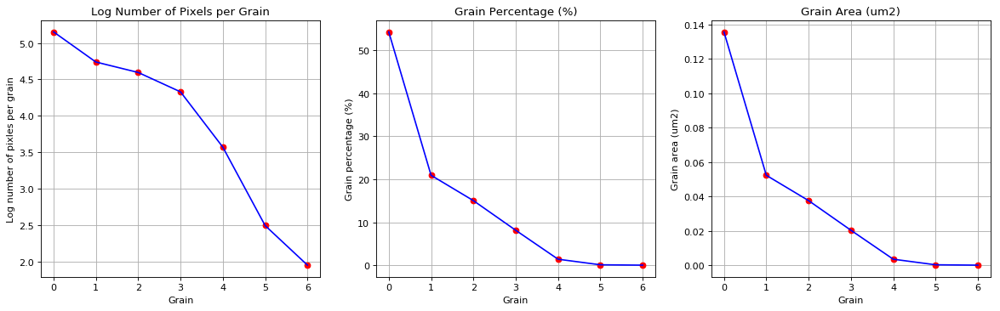

In [242]:
# Show grain area distribution after instance segmentation
post.show_grain_area_distribution(grain_labels, data_type, data_subtype)


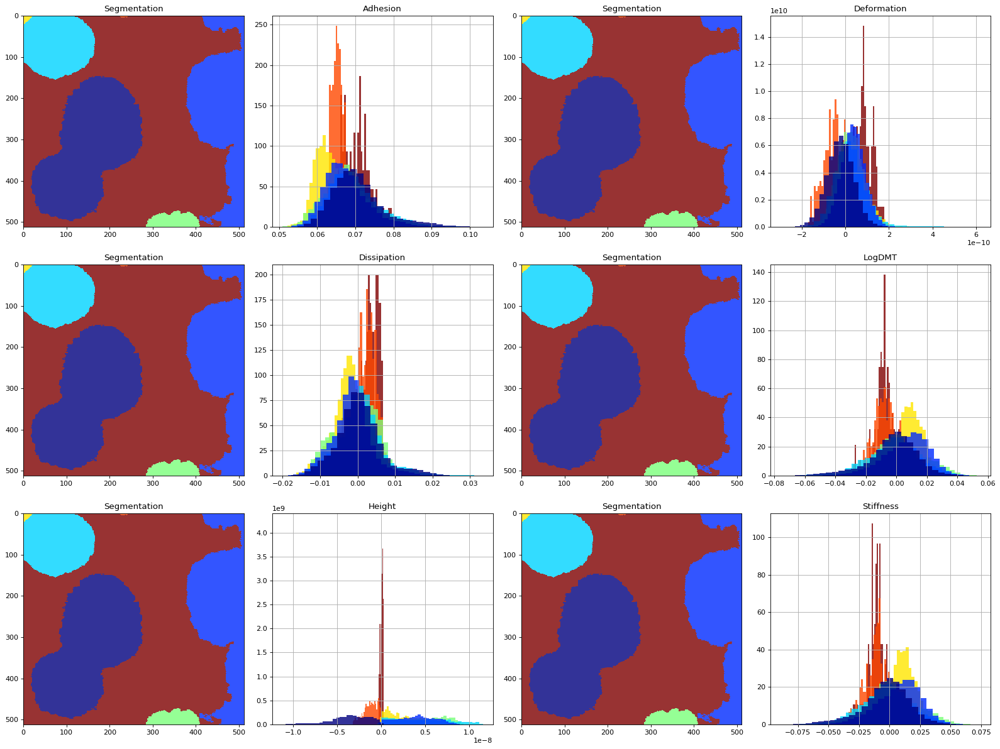

In [243]:
# Distributions of grains after instance segmentation
if noise_removal_flag:
    post.show_distributions_together(grain_labels, no_outliers_data, data_type, input_cmap=input_cmap)
else:
    post.show_distributions_together(grain_labels, data, data_type, input_cmap=input_cmap)
    

In [252]:
# Apply instance segmentation (persistence watershed)
seg_w = seg_water.SegmenterWatershed()
height_id = new_data_properties.index("Height")
height_data = data[:, :, height_id]

thresh = 0.3 # TODO: change to 0.01 for cAMF and AMFM and 0.4 otherwise. 0.3 for 2componentfilm
if noise_removal_flag:
    labels = seg_w.fit_transform(height_data, outliers, pers_thresh=thresh)
else:
    labels = seg_w.fit_transform(height_data, pers_thresh=thresh)
    

In [253]:
if fill_zeros_flag:
    labels = slu.fill_out_zeros(labels, labels == 0)
elif noise_removal_flag:
    labels = np.ma.masked_where(labels == 0, labels)


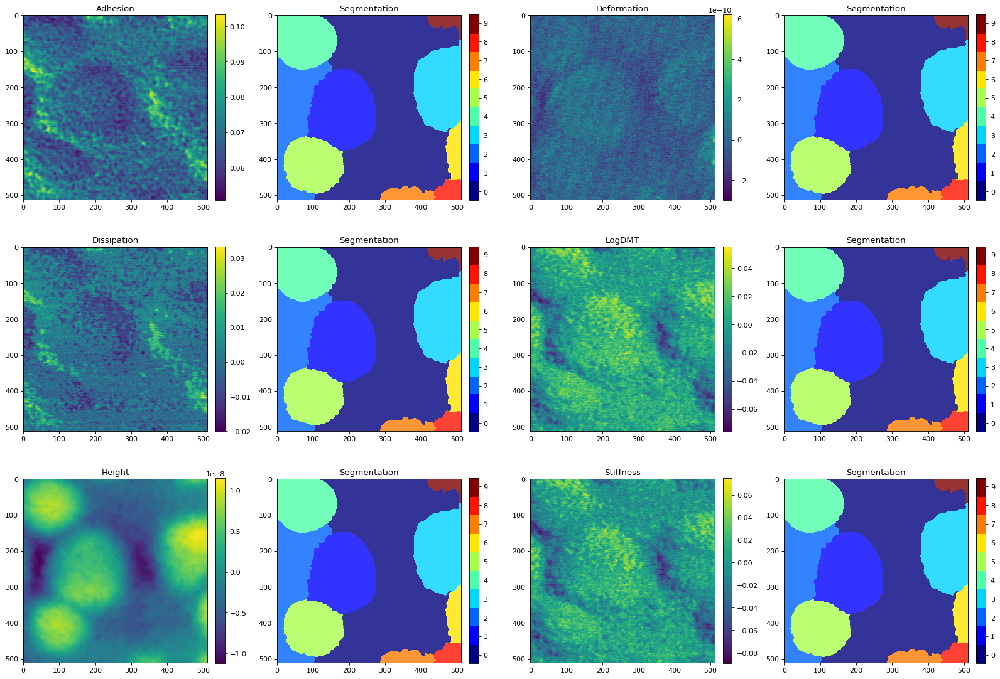

In [254]:
# Instance (grains) segmentation of properties
if noise_removal_flag:
    post.show_classification(labels, no_outliers_data, data_type)
else:
    post.show_classification(labels, data, data_type)


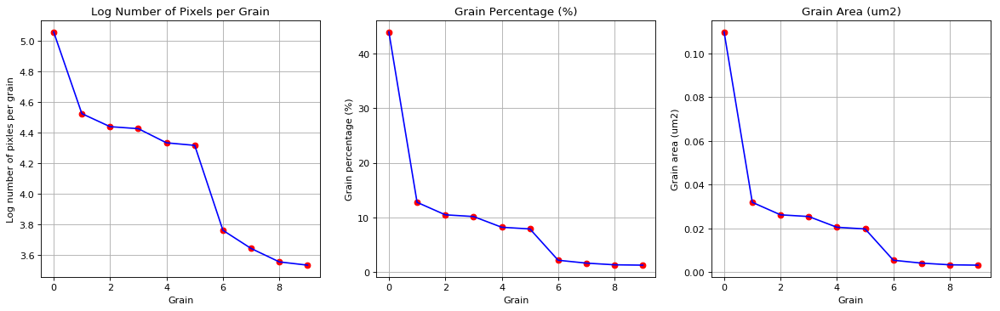

In [255]:
# Show grain area distribution after instance segmentation
post.show_grain_area_distribution(labels, data_type, data_subtype)

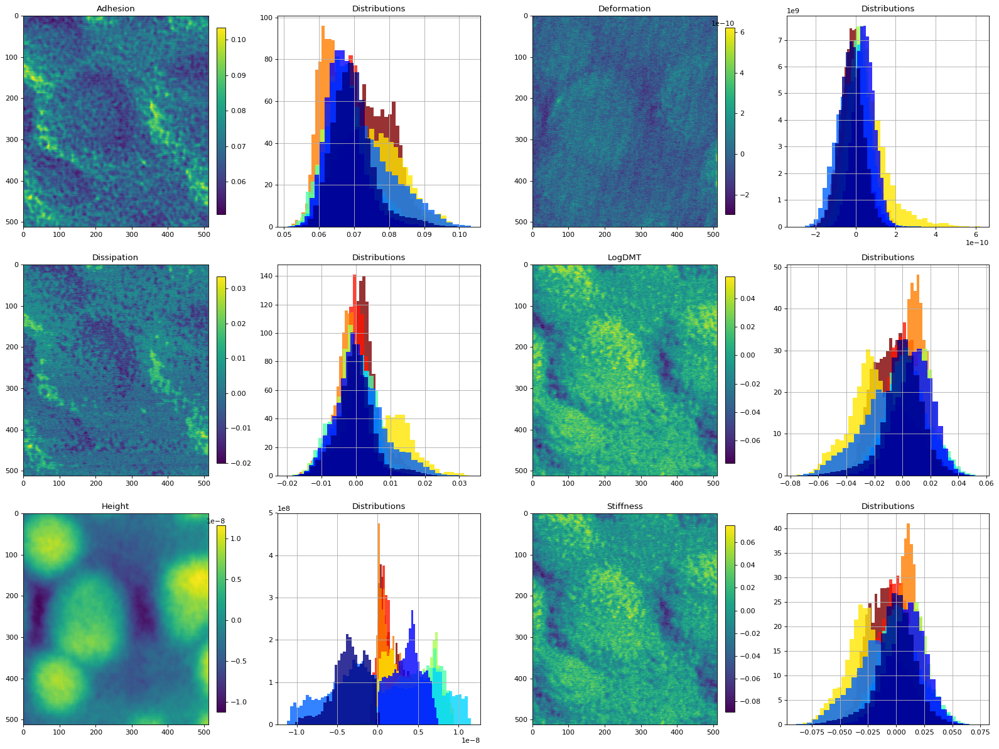

In [256]:
# Distributions of grains after instance segmentation
if noise_removal_flag:
    post.show_classification_distributions(labels, no_outliers_data, data_type)
else:
    post.show_classification_distributions(labels, data, data_type)


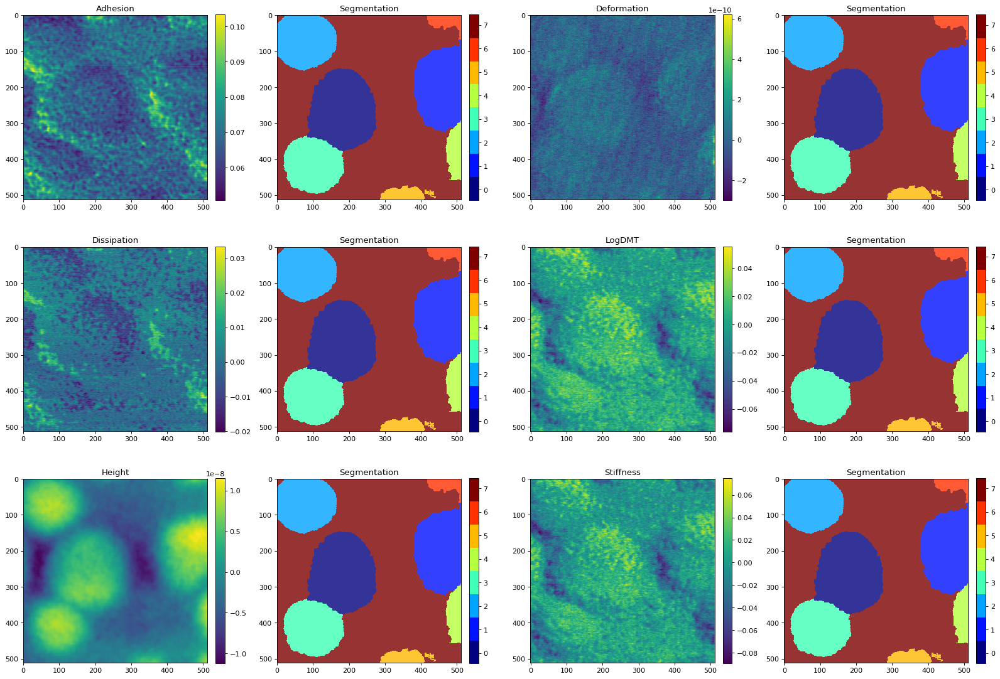

In [257]:
# Instance segmentation (using persistence watershed combined with gmm segmentation
labels[pre_labels == 1] = np.max(labels) + 1 # map background label of gmm to next pws label
for l in np.unique(labels): # clean up small pws labels
    if np.sum(labels == l) < 2000:
        labels = slu.fill_out_zeros(labels, labels == l)
    
labels = slu.get_significant_labels(labels, bg_contrast_flag=True)
if noise_removal_flag:
    post.show_classification(labels, no_outliers_data, data_type)
else:
    post.show_classification(labels, data, data_type)
